<a href="https://colab.research.google.com/github/limceprapan/FullStackJSTrain/blob/main/KeyLandmarkGen.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install mediapipe


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 13.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manyl

['KA.AN2.40.tiff', 'KA.AN3.41.tiff', 'KA.DI1.42.tiff', 'KA.DI2.43.tiff', 'KA.DI3.44.tiff', 'KA.FE1.45.tiff', 'KA.FE2.46.tiff', 'KA.FE3.47.tiff', 'KA.FE4.48.tiff', 'KA.HA1.29.tiff', 'KA.HA2.30.tiff', 'KA.HA3.31.tiff', 'KA.HA4.32.tiff', 'KA.NE1.26.tiff', 'KA.NE2.27.tiff', 'KA.NE3.28.tiff', 'KA.SA1.33.tiff', 'KA.SA2.34.tiff', 'KA.SA3.35.tiff', 'KA.SU1.36.tiff', 'KA.SU2.37.tiff', 'KA.SU3.38.tiff', 'KA.AN1.39.tiff', 'png']


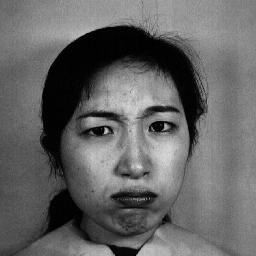

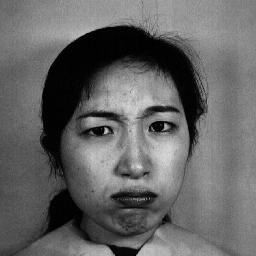

FaceLandmarkerResult(face_landmarks=[], face_blendshapes=[], facial_transformation_matrixes=[])


AttributeError: 'numpy.ndarray' object has no attribute 'numpy_view'

In [32]:
import cv2
from google.colab.patches import cv2_imshow

import os
from google.colab import drive

from PIL import Image

import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

os.chdir('/content/drive/MyDrive/Colab Notebooks/FacialExpression/JAFFE')
path = os.getcwd()
files_and_directories = os.listdir(path)
print(files_and_directories)

imgFileName = files_and_directories[1]
newimgFileName = imgFileName.replace(".tiff", "")
# print(imgFileName)
image_path = path + '/' + imgFileName
new_image_path = path + '/png/' + newimgFileName + '.png'
# # Read the image
image = cv2.imread(image_path)
cv2_imshow(image)

tiff_image = Image.open(image_path)
tiff_image.save(new_image_path, 'PNG')

newimage = cv2.imread(new_image_path)

cv2_imshow(newimage)


model_path = '/content/drive/MyDrive/Colab Notebooks/FacialExpression/face_landmarker.task'

BaseOptions = mp.tasks.BaseOptions
FaceLandmarker = mp.tasks.vision.FaceLandmarker
FaceLandmarkerOptions = mp.tasks.vision.FaceLandmarkerOptions
VisionRunningMode = mp.tasks.vision.RunningMode

options = FaceLandmarkerOptions(
    base_options=BaseOptions(model_asset_path=model_path),
    running_mode=VisionRunningMode.IMAGE)

with FaceLandmarker.create_from_options(options) as landmarker:
  mp_image = mp.Image.create_from_file(new_image_path)

  face_landmarker_result = landmarker.detect(mp_image)
  print(face_landmarker_result)

  annotated_image = draw_landmarks_on_image(image.numpy_view(), face_landmarker_result)
  cv2_imshow(cv2.cvtColor(annotated_image, cv2.COLOR_RGB2BGR))





In [33]:
!wget -q -O detector.tflite -q https://storage.googleapis.com/mediapipe-models/face_detector/blaze_face_short_range/float16/1/blaze_face_short_range.tflite

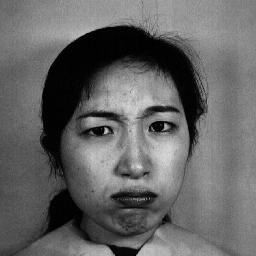

In [36]:
!wget -q -O image.jpg https://i.imgur.com/Vu2Nqwb.jpg

IMAGE_FILE = 'KA.AN3.41.png'

import cv2
from google.colab.patches import cv2_imshow

imgPath = '/content/drive/MyDrive/Colab Notebooks/FacialExpression/JAFFE/png/' + IMAGE_FILE

img = cv2.imread(imgPath)
cv2_imshow(img)

In [47]:
from typing import Tuple, Union
import math
import cv2
import numpy as np

MARGIN = 10  # pixels
ROW_SIZE = 10  # pixels
FONT_SIZE = 1
FONT_THICKNESS = 1
TEXT_COLOR = (255, 0, 0)  # red


def _normalized_to_pixel_coordinates(
    normalized_x: float, normalized_y: float, image_width: int,
    image_height: int) -> Union[None, Tuple[int, int]]:
  """Converts normalized value pair to pixel coordinates."""

  # Checks if the float value is between 0 and 1.
  def is_valid_normalized_value(value: float) -> bool:
    return (value > 0 or math.isclose(0, value)) and (value < 1 or
                                                      math.isclose(1, value))

  if not (is_valid_normalized_value(normalized_x) and
          is_valid_normalized_value(normalized_y)):
    # TODO: Draw coordinates even if it's outside of the image bounds.
    return None
  x_px = min(math.floor(normalized_x * image_width), image_width - 1)
  y_px = min(math.floor(normalized_y * image_height), image_height - 1)
  return x_px, y_px


def visualize(
    image,
    detection_result
) -> np.ndarray:
  """Draws bounding boxes and keypoints on the input image and return it.
  Args:
    image: The input RGB image.
    detection_result: The list of all "Detection" entities to be visualize.
  Returns:
    Image with bounding boxes.
  """
  annotated_image = image.copy()
  height, width, _ = image.shape

  for detection in detection_result.detections:
    # Draw bounding_box
    bbox = detection.bounding_box
    start_point = bbox.origin_x, bbox.origin_y
    end_point = bbox.origin_x + bbox.width, bbox.origin_y + bbox.height
    cv2.rectangle(annotated_image, start_point, end_point, TEXT_COLOR, 3)

    # Draw keypoints
    for keypoint in detection.keypoints:
      keypoint_px = _normalized_to_pixel_coordinates(keypoint.x, keypoint.y,
                                                     width, height)
      color, thickness, radius = (0, 255, 0), 2, 2
      cv2.circle(annotated_image, keypoint_px, thickness, color, radius)

    # Draw label and score
    category = detection.categories[0]
    category_name = category.category_name
    category_name = '' if category_name is None else category_name
    probability = round(category.score, 2)
    result_text = category_name + ' (' + str(probability) + ')'
    text_location = (MARGIN + bbox.origin_x,
                     MARGIN + ROW_SIZE + bbox.origin_y)
    cv2.putText(annotated_image, result_text, text_location, cv2.FONT_HERSHEY_PLAIN,
                FONT_SIZE, TEXT_COLOR, FONT_THICKNESS)

  return annotated_image

DetectionResult(detections=[Detection(bounding_box=BoundingBox(origin_x=64, origin_y=53, width=228, height=228), categories=[Category(index=0, score=0.973780632019043, display_name=None, category_name=None)], keypoints=[NormalizedKeypoint(x=0.18205323815345764, y=0.29705899953842163, label='', score=0.0), NormalizedKeypoint(x=0.3278907239437103, y=0.2915711998939514, label='', score=0.0), NormalizedKeypoint(x=0.24293898046016693, y=0.44634896516799927, label='', score=0.0), NormalizedKeypoint(x=0.2534431517124176, y=0.5332074165344238, label='', score=0.0), NormalizedKeypoint(x=0.13147179782390594, y=0.3145616054534912, label='', score=0.0), NormalizedKeypoint(x=0.436631441116333, y=0.30183279514312744, label='', score=0.0)]), Detection(bounding_box=BoundingBox(origin_x=307, origin_y=96, width=215, height=215), categories=[Category(index=0, score=0.9226626753807068, display_name=None, category_name=None)], keypoints=[NormalizedKeypoint(x=0.6138510704040527, y=0.3713412284851074, label=

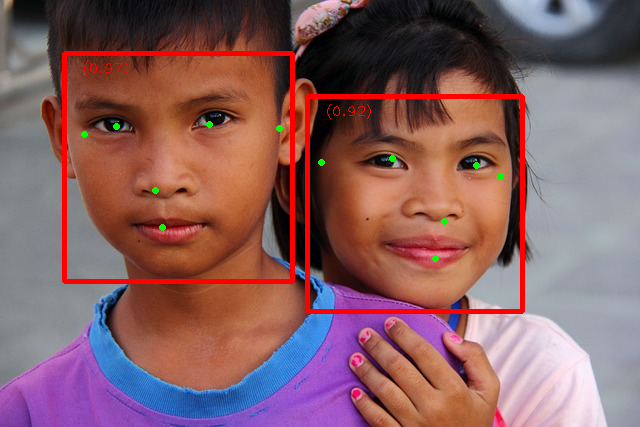

In [51]:
import numpy as np
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

IMAGE_FILE = 'test1.jpg'


modelPath = '/content/drive/MyDrive/Colab Notebooks/FacialExpression/JAFFE/detector.tflite'

# STEP 2: Create an FaceDetector object.
base_options = python.BaseOptions(model_asset_path= modelPath )
options = vision.FaceDetectorOptions(base_options=base_options)
detector = vision.FaceDetector.create_from_options(options)

# STEP 3: Load the input image.
imgPath = '/content/drive/MyDrive/Colab Notebooks/FacialExpression/JAFFE/png/' + IMAGE_FILE
image = mp.Image.create_from_file(imgPath)

# STEP 4: Detect faces in the input image.
detection_result = detector.detect(image)
print(detection_result)


# STEP 5: Process the detection result. In this case, visualize it.
image_copy = np.copy(image.numpy_view())
annotated_image = visualize(image_copy, detection_result)
rgb_annotated_image = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
cv2_imshow(rgb_annotated_image)


<class 'list'>


<ipython-input-129-ffdb472d38c2>:63: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20, 15))


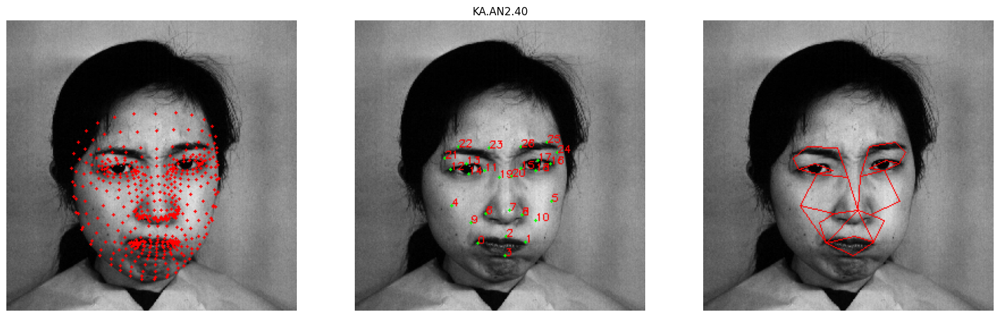

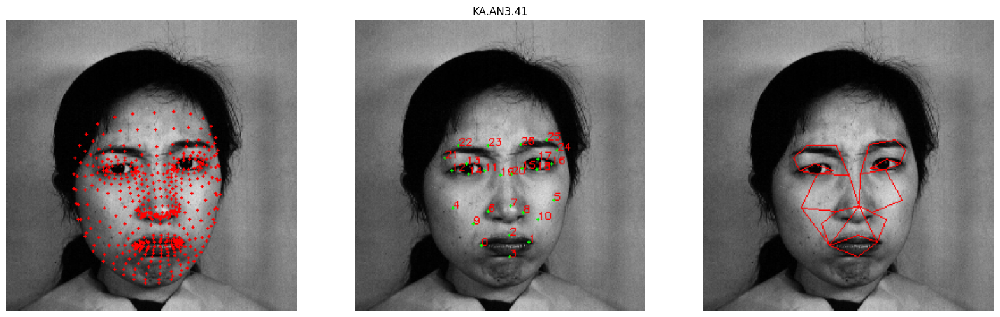

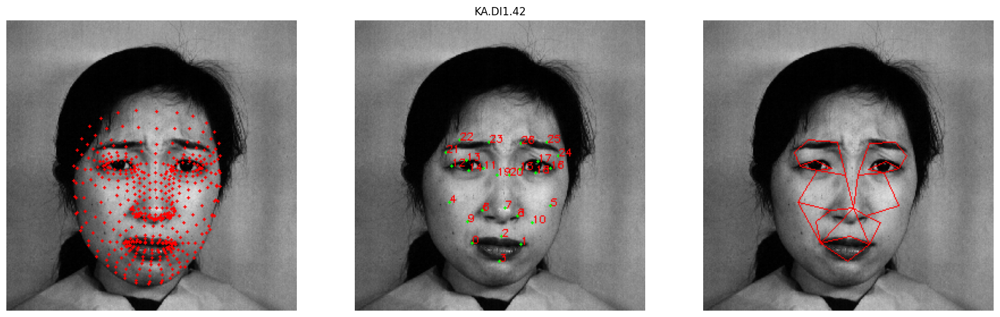

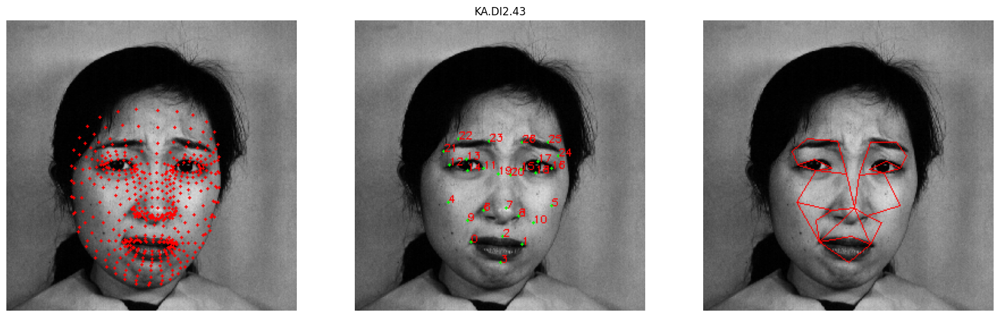

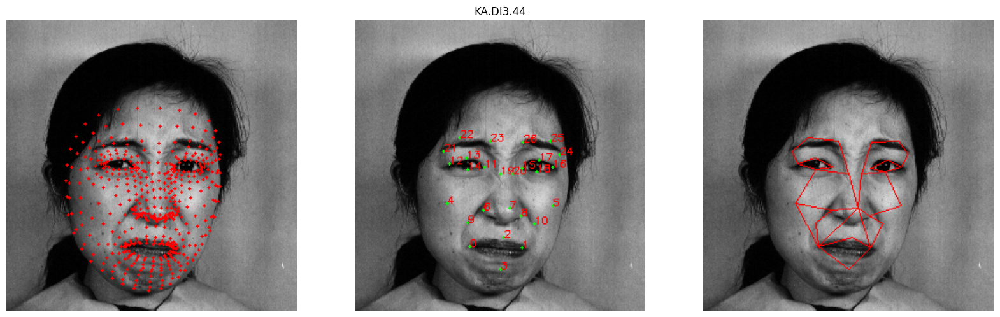

...

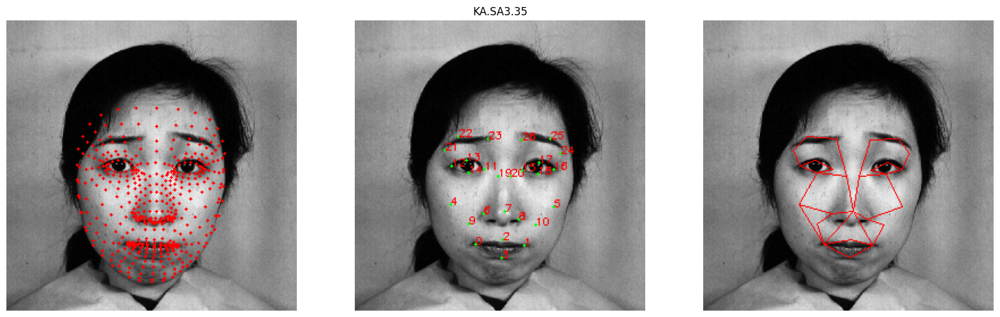

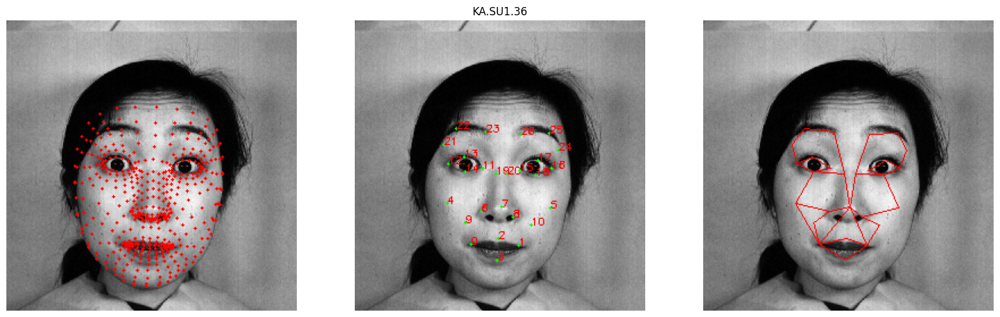

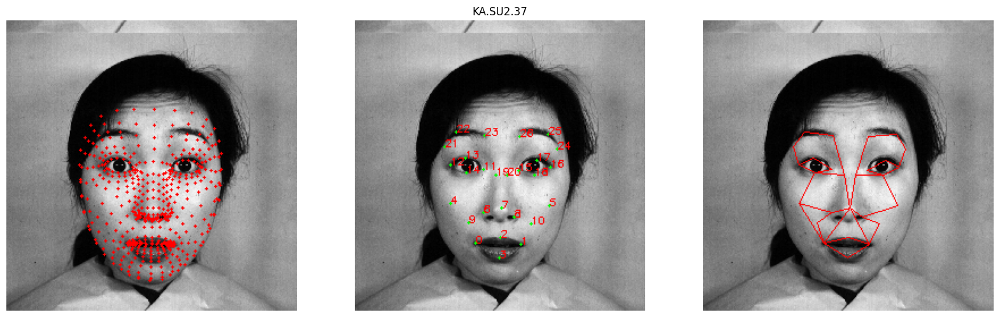

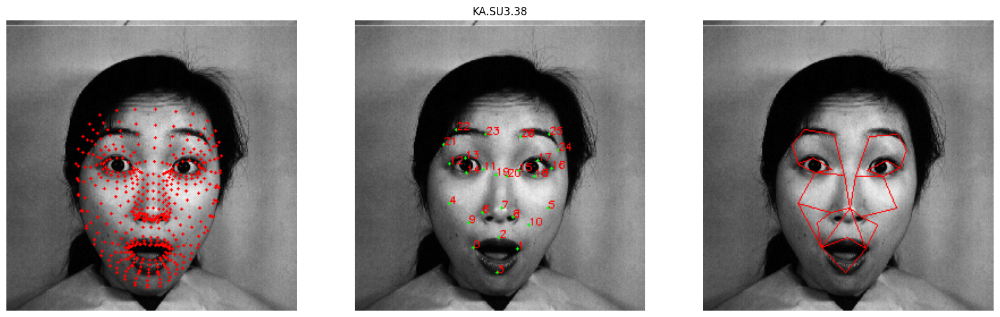

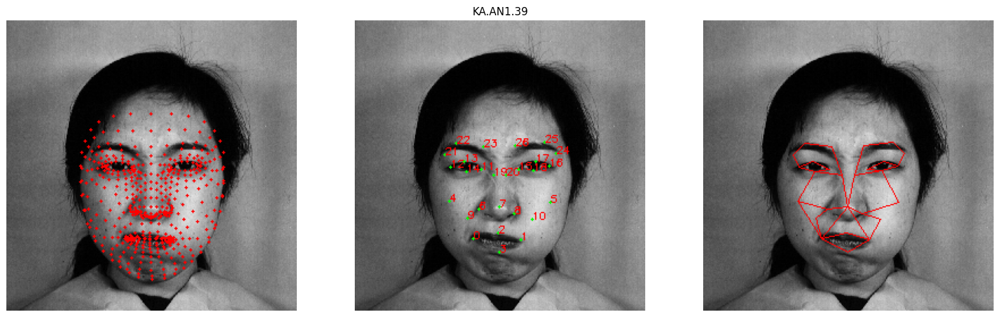

In [129]:
import mediapipe as mp
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

Edges = [(0,2),(0,3),(1,2),(1,3),(7,6),(7,8),(6,4),(8,5),(6,9),(9,0)
         ,(4,0),(8,10),(10,1),(7,19),(7,20),(7,0),(7,1),(19,23),(19,14)
         ,(23,22),(22,21),(21,12),(12,13),(12,14),(11,13),(11,14),(14,4),(20,26),(26,25)
         ,(25,24),(24,16),(16,17),(16,18),(15,17),(15,18),(18,20),(18,5)]

key_sel = [61,292,0,17,50,280,48,4,289,206,426,
           133,130,159,145,362,359,386,374,122,351,
           46,105,107,276,334,336]

mp_face_mesh = mp.solutions.face_mesh
face_mesh = mp_face_mesh.FaceMesh(static_image_mode=True, max_num_faces=1, min_detection_confidence=0.5)

print(type(key_sel))

filePath = '/content/drive/MyDrive/Colab Notebooks/FacialExpression/JAFFE'
files_and_directories = os.listdir(filePath)
# print(files_and_directories)

for imgFilename in files_and_directories:
  key_data = []
  if imgFilename.find('.tiff') > 0:
    newimgFileName = imgFilename.replace(".tiff", "")
    new_image_path = filePath + '/png/' + newimgFileName + '.png'
    img = Image.open(filePath + '/' + imgFilename)
    img.save(new_image_path, 'PNG')

    image = cv2.imread(new_image_path)
    imgKey = image.copy()
    imgEdge = image.copy()

    results = face_mesh.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    if results.multi_face_landmarks:
        for face_landmarks in results.multi_face_landmarks:
          for idx, landmark in enumerate(face_landmarks.landmark):
              x = int(landmark.x * image.shape[1])
              y = int(landmark.y * image.shape[0])

              # For Show all 468 MediaPipe Landmark
              cv2.circle(image, (x, y), 1, (255, 0, 0), -1)
              # cv2.putText(image, str(idx), (x, y), cv2.FONT_HERSHEY_SIMPLEX, 0.25, (0, 255, 0), 1)

              if idx in key_sel:
                keyland_idx = key_sel.index(idx)
                cv2.circle(imgKey, (x, y), 1, (0, 255, 0), -1)
                cv2.putText(imgKey, str(keyland_idx), (x, y), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 0, 0), 1)
                key_data.append({'id': keyland_idx, 'x': x, 'y': y})

          for edge in Edges :
            result1 = next((item for item in key_data if item['id'] == edge[0]), None)
            result2 = next((item for item in key_data if item['id'] == edge[1]), None)
            point1 = (result1['x'],result1['y'])
            point2 = (result2['x'],result2['y'])
            cv2.line(imgEdge, point1, point2, (255, 0, 0), thickness=1)

            # print(edge[0],':',point1['x'],point1['y'],edge[1],':',point2['x'],point2['y'])

    plt.figure(figsize=(20, 15))
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(imgKey)
    plt.axis('off')
    plt.title(newimgFileName)

    plt.subplot(1, 3, 3)
    plt.imshow(imgEdge)
    plt.axis('off')

    # print(key_data)


In [112]:
keyData = [{'id': 2, 'x': 126, 'y': 187}, {'id': 7, 'x': 127, 'y': 164}, {'id': 3, 'x': 127, 'y': 204}, {'id': 21, 'x': 79, 'y': 118}, {'id': 6, 'x': 109, 'y': 166}, {'id': 4, 'x': 83, 'y': 159}, {'id': 0, 'x': 104, 'y': 192}, {'id': 22, 'x': 89, 'y': 108}, {'id': 23, 'x': 113, 'y': 111}, {'id': 19, 'x': 122, 'y': 136}, {'id': 12, 'x': 84, 'y': 129}, {'id': 11, 'x': 111, 'y': 131}, {'id': 14, 'x': 98, 'y': 133}, {'id': 13, 'x': 96, 'y': 124}, {'id': 9, 'x': 99, 'y': 174}, {'id': 24, 'x': 177, 'y': 117}, {'id': 5, 'x': 172, 'y': 160}, {'id': 8, 'x': 140, 'y': 170}, {'id': 1, 'x': 146, 'y': 193}, {'id': 25, 'x': 167, 'y': 107}, {'id': 26, 'x': 141, 'y': 110}, {'id': 20, 'x': 133, 'y': 136}, {'id': 16, 'x': 171, 'y': 128}, {'id': 15, 'x': 144, 'y': 131}, {'id': 18, 'x': 157, 'y': 132}, {'id': 17, 'x': 191, 'y': 116}, {'id': 10, 'x': 156, 'y': 175}]

Edges = [(0,2),(0,3),(1,2),(1,3),(7,6),(7,8),(6,4),(8,5),(6,9),(9,0)
         ,(4,0),(8,10),(10,1),(7,19),(7,20),(7,0),(7,1),(19,23),(19,14)
         ,(23,22),(22,21),(21,12),(12,13),(12,14),(11,13),(11,14),(14,4),(20,26),(26,25)
         ,(25,24),(24,16),(16,17),(16,18),(15,17),(15,18),(18,20),(18,5)]

for edge in Edges :
  point1 = next((item for item in keyData if item['id'] == edge[0]), None)
  point2 = next((item for item in keyData if item['id'] == edge[1]), None)

  print(edge[0],':',point1['x'],point1['y'],edge[1],':',point2['x'],point2['y'])


0 : 104 192 2 : 126 187
0 : 104 192 3 : 127 204
1 : 146 193 2 : 126 187
1 : 146 193 3 : 127 204
7 : 127 164 6 : 109 166
7 : 127 164 8 : 140 170
6 : 109 166 4 : 83 159
8 : 140 170 5 : 172 160
6 : 109 166 9 : 99 174
9 : 99 174 0 : 104 192
4 : 83 159 0 : 104 192
8 : 140 170 10 : 156 175
10 : 156 175 1 : 146 193
7 : 127 164 19 : 122 136
7 : 127 164 20 : 133 136
7 : 127 164 0 : 104 192
7 : 127 164 1 : 146 193
19 : 122 136 23 : 113 111
19 : 122 136 14 : 98 133
23 : 113 111 22 : 89 108
22 : 89 108 21 : 79 118
21 : 79 118 12 : 84 129
12 : 84 129 13 : 96 124
12 : 84 129 14 : 98 133
11 : 111 131 13 : 96 124
11 : 111 131 14 : 98 133
14 : 98 133 4 : 83 159
20 : 133 136 26 : 141 110
26 : 141 110 25 : 167 107
25 : 167 107 24 : 177 117
24 : 177 117 16 : 171 128
16 : 171 128 17 : 191 116
16 : 171 128 18 : 157 132
15 : 144 131 17 : 191 116
15 : 144 131 18 : 157 132
18 : 157 132 20 : 133 136
18 : 157 132 5 : 172 160
